# 음성 데이터 분석 

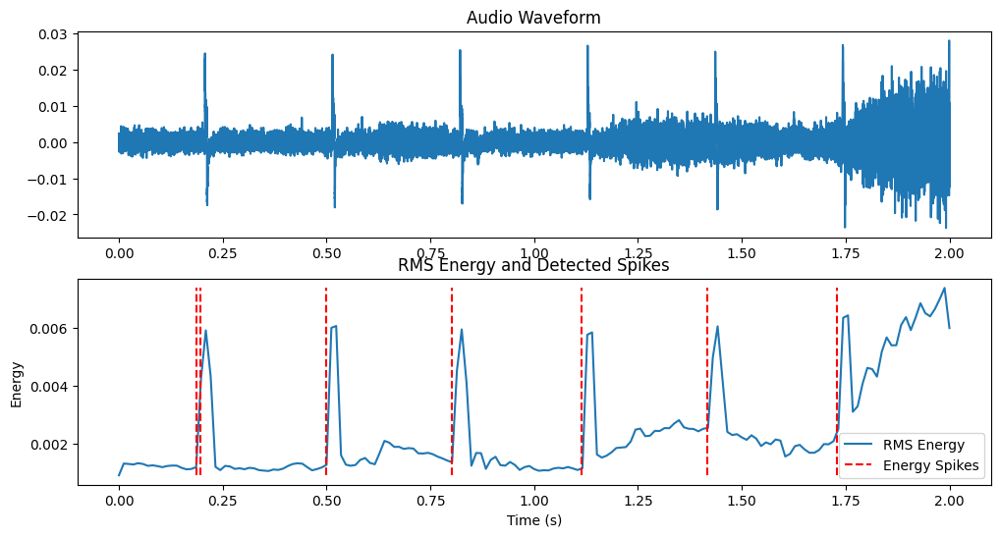

Detected spike at 0.19 seconds with RMS energy of 0.00118
Detected spike at 0.20 seconds with RMS energy of 0.00423
Detected spike at 0.50 seconds with RMS energy of 0.00126
Detected spike at 0.80 seconds with RMS energy of 0.00135
Detected spike at 1.11 seconds with RMS energy of 0.00114
Detected spike at 1.42 seconds with RMS energy of 0.00254
Detected spike at 1.73 seconds with RMS energy of 0.00251


In [48]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

def detect_energy_spikes(audio, sr, frame_length=1024, hop_length=512, threshold_scale=1.5):
    # RMS 에너지 계산
    energy = librosa.feature.rms(y=audio, frame_length=frame_length, hop_length=hop_length)[0]
    # 에너지 변화율 계산
    energy_diff = np.diff(energy)
    # 임계값 설정
    threshold = np.mean(energy_diff) + threshold_scale * np.std(energy_diff)
    # 급격한 에너지 변화 지점 감지
    spikes = np.where(energy_diff > threshold)[0]
    # 클릭 시간으로 변환
    spike_times = librosa.frames_to_time(spikes, sr=sr, hop_length=hop_length)
    # 각 클릭 시간에 해당하는 RMS 에너지 값 추출
    spike_energies = energy[spikes]
    
    return spike_times, spike_energies, energy, energy_diff

def plot_energy_and_spikes(audio, sr, spike_times, energy):
    # 시간 축 생성
    times = np.linspace(0, len(audio) / sr, num=len(audio))
    energy_times = np.linspace(0, len(audio) / sr, num=len(energy))
    
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 1, 1)
    plt.plot(times, audio, label='Audio Waveform')
    plt.title("Audio Waveform")
    
    plt.subplot(2, 1, 2)
    plt.plot(energy_times, energy, label='RMS Energy')
    plt.vlines(spike_times, ymin=min(energy), ymax=max(energy), color='r', linestyle='--', label='Energy Spikes')
    plt.title("RMS Energy and Detected Spikes")
    plt.xlabel("Time (s)")
    plt.ylabel("Energy")
    plt.legend()
    plt.show()

# 파일 로드 및 클릭음 감지
file_path = r"C:\Users\atoz\cow_noise_reduction\data\EICD2024101600320241107065951.WAV"
start_time = 11  # 분석 시작 시간 (초)
end_time = 13  # 분석 종료 시간 (초)
audio, sr = librosa.load(file_path, sr=None, offset=start_time, duration=end_time - start_time)
spike_times, spike_energies, energy, energy_diff = detect_energy_spikes(audio, sr)
plot_energy_and_spikes(audio, sr, spike_times, energy)

# 감지된 클릭 시간과 에너지 값을 저장하는 리스트
detected_spikes = [{'time': time, 'energy': energy} for time, energy in zip(spike_times, spike_energies)]

# 감지된 클릭 시간과 에너지 값 출력
for spike in detected_spikes:
    print(f"Detected spike at {spike['time']:.2f} seconds with RMS energy of {spike['energy']:.5f}")


In [49]:
import pandas as pd

# detected_spikes 리스트를 데이터 프레임으로 변환
spikes_df = pd.DataFrame(detected_spikes)

# 첫 번째 행 삭제 (인덱스 0 제거)
spikes_df = spikes_df.drop(index=0).reset_index(drop=True)

# 시간 간격 측정
spikes_df['time_interval'] = spikes_df['time'].diff()

print(spikes_df)


       time    energy  time_interval
0  0.197370  0.004234            NaN
1  0.499229  0.001259       0.301859
2  0.801088  0.001350       0.301859
3  1.114558  0.001143       0.313469
4  1.416417  0.002536       0.301859
5  1.729887  0.002506       0.313469


간격에 비슷한 패턴이 있다는 걸 알 수 있음(모든 파일 같은 패턴) -> 간격을 알았으니 클릭음의 간격 패턴을 파악해서 클릭음 삭제 

# 음성 데이터 패턴 분석

### 전체 파형 시각화

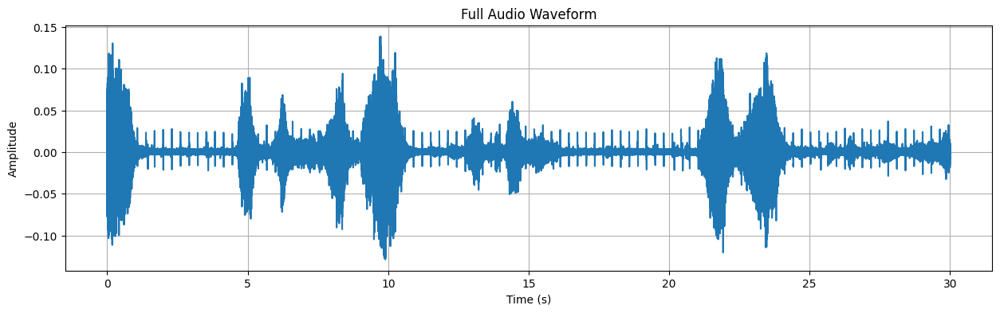

In [52]:
def visualize_audio(audio_path):
    y, sr = librosa.load(audio_path)
    
    plt.figure(figsize=(15, 4))
    plt.plot(np.arange(len(y)) / sr, y)
    plt.title('Full Audio Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()
    
    return y, sr

# 오디오 파일 시각화
y, sr = visualize_audio(r'C:\Users\atoz\cow_noise_reduction\data\EICD2024101600320241107065951.WAV')

###  자주 나오는 패턴 분석 -> 전체에 적용 -> HPSS 적용

클릭음 간의 간격: [0.30351474 0.31530612 0.56653061 0.30721088 0.30734694 0.30712018
 0.30714286 0.30743764 0.30705215 0.30723356 0.30705215 0.30723356
 0.30723356 0.30716553 0.31707483 0.30326531 0.30133787 0.5477551
 0.3738322  0.30707483 0.30764172 0.34884354 0.44600907 0.37188209
 0.36888889 0.31235828 0.30260771 0.36680272 0.51736961 0.34426304
 0.30698413 0.30714286 0.30727891 0.30709751 0.30723356 0.30734694
 0.30707483 0.47514739 0.44648526 0.30723356 0.44122449 0.48052154
 0.30693878 0.30732426 0.30714286 0.30725624 0.30727891 0.30702948
 0.30732426 0.30709751 0.30714286 0.30725624 0.30727891 0.30705215
 0.30732426 0.30714286 0.30716553 0.30725624 0.30721088 0.30721088
 0.30712018 0.57068027 0.30267574 0.31986395 0.34297052 0.50904762
 0.37274376 0.32013605 0.34281179 0.2985034  0.3069161  0.30725624
 0.30723356 0.30730159 0.30716553 0.30721088 0.30716553 0.30723356
 0.30712018 0.30718821 0.30716553 0.30730159 0.30709751 0.30732426
 0.30709751 0.31297052 0.30160998 0.52800454] 초
클릭음 

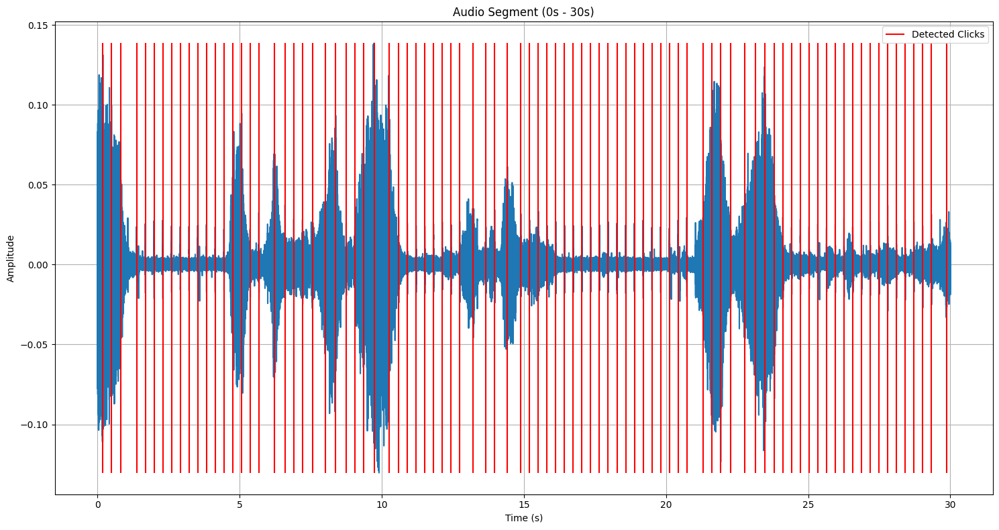

확장된 클릭음 시간: [ 0.19156463  0.49507937  0.81038549  1.3769161   1.68412698  1.99147392
  2.2985941   2.60573696  2.9131746   3.22022676  3.52746032  3.83451247
  4.14174603  4.44897959  4.75614512  5.07321995  5.37648526  5.67782313
  6.22557823  6.59941043  6.90648526  7.21412698  7.56297052  8.00897959
  8.38086168  8.74975057  9.06210884  9.36471655  9.73151927 10.24888889
 10.59315193 10.90013605 11.20727891 11.51455782 11.82165533 12.12888889
 12.43623583 12.74331066 13.21845805 13.66494331 13.97217687 14.41340136
 14.8939229  15.20086168 15.50818594 15.8153288  16.12258503 16.42986395
 16.73689342 17.04421769 17.35131519 17.65845805 17.96571429 18.2729932
 18.58004535 18.88736961 19.19451247 19.501678   19.80893424 20.11614512
 20.42335601 20.73047619 21.30115646 21.6038322  21.92369615 22.26666667
 22.77571429 23.14845805 23.4685941  23.8114059  24.1099093  24.4168254
 24.72408163 25.03131519 25.33861678 25.64578231 25.9529932  26.26015873
 26.56739229 26.87451247 27.18170068 27.4


패턴 제거 후 오디오 재생:


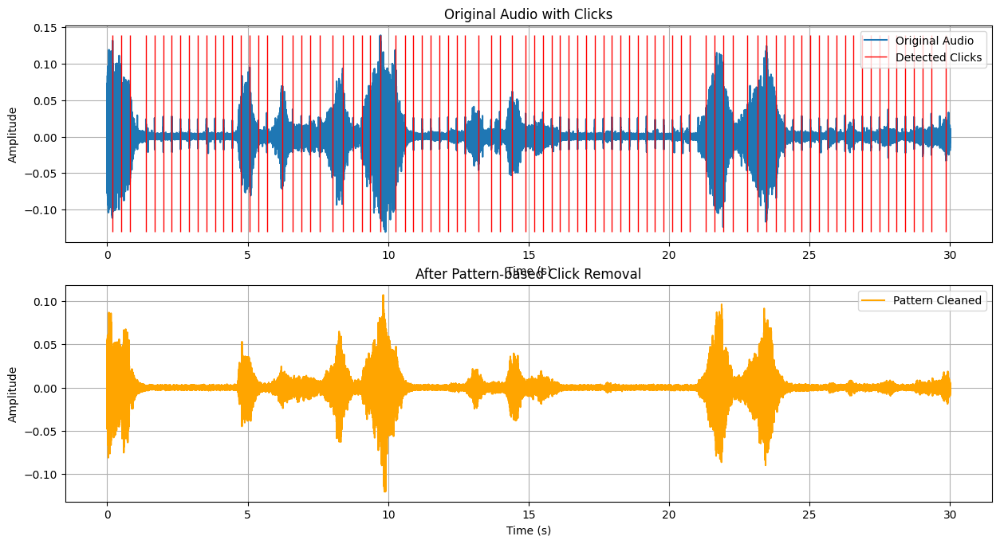

In [53]:
import soundfile as sf
from scipy.signal import find_peaks
from IPython.display import Audio

def analyze_time_segment(audio_path, start_time=0, end_time=30):
    """
    특정 시간 구간의 오디오를 분석하고 클릭음 패턴을 찾아 출력
    """
    y, sr = librosa.load(audio_path, sr=None)

    # 시간을 샘플 인덱스로 변환
    start_idx = int(start_time * sr)
    end_idx = int(end_time * sr)

    # 구간 추출
    segment = y[start_idx:end_idx]

    # 피크 감지 (임계값과 간격 조정)
    peaks, properties = find_peaks(np.abs(segment), height=0.009, distance=sr*0.298)

    # 클릭음 정보 출력
    click_times = peaks / sr + start_time
    if len(click_times) > 1:
        intervals = np.diff(click_times)
        print("클릭음 간의 간격:", intervals, "초")
        avg_interval = np.mean(intervals)
    else:
        print("감지된 클릭음이 없습니다.")
        return None, None, None

    print("클릭음 시작 시간:", click_times, "초")
    duration = 0.05

    # 시각화
    plt.figure(figsize=(15, 8))
    time = np.arange(len(segment)) / sr + start_time
    plt.plot(time, segment)
    plt.vlines(click_times, ymin=segment.min(), ymax=segment.max(), color='r', label='Detected Clicks')
    plt.title(f'Audio Segment ({start_time}s - {end_time}s)')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return click_times, avg_interval, duration

def apply_pattern_to_full_audio(click_times, interval, total_duration):
    """
    발견된 패턴을 이용하여 전체 오디오에 클릭음 위치 적용
    """
    extended_times = np.array(click_times)

    # 클릭음 위치 확장 (앞뒤로 연장)
    prev_time = click_times[0]
    while prev_time - interval > 0:
        prev_time -= interval
        extended_times = np.insert(extended_times, 0, prev_time)

    next_time = click_times[-1]
    while next_time + interval < total_duration:
        next_time += interval
        extended_times = np.append(extended_times, next_time)

    return extended_times

def remove_clicks_and_noise(audio_data, sr, click_times, duration):
    """
    클릭음 제거 후 HPSS를 적용하여 남은 노이즈 제거
    """
    # 먼저 패턴 기반으로 클릭음 제거
    cleaned_audio = audio_data.copy()
    click_samples = int(duration * sr)

    for click_time in click_times:
        start_idx = max(0, int(click_time * sr) - click_samples // 2)
        end_idx = min(len(audio_data), start_idx + click_samples)

        if end_idx < len(audio_data):
            before_click = cleaned_audio[max(0, start_idx - click_samples): start_idx]
            after_click = cleaned_audio[end_idx: min(len(audio_data), end_idx + click_samples)]
            
            if len(before_click) > 0 and len(after_click) > 0:
                x = np.array([start_idx - click_samples, end_idx])
                y_interp = np.array([np.median(before_click), np.median(after_click)])
                cleaned_audio[start_idx:end_idx] = np.interp(np.arange(start_idx, end_idx), x, y_interp)

    # HPSS 적용하여 남은 타악기적 노이즈 제거
    D = librosa.stft(cleaned_audio)
    H, P = librosa.decompose.hpss(D)
    y_harmonic = librosa.istft(H, length=len(cleaned_audio))

    return y_harmonic

def visualize_waveforms_with_clicks(original_audio, pattern_cleaned,  sr, click_times):

    time = np.arange(len(original_audio)) / sr

    plt.figure(figsize=(15, 12))

    # 원본 오디오 시각화
    plt.subplot(3, 1, 1)
    plt.plot(time, original_audio, label="Original Audio")
    plt.vlines(click_times, ymin=original_audio.min(), ymax=original_audio.max(), 
              color='r', linewidth=1, label='Detected Clicks')
    plt.title('Original Audio with Clicks')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)

    # 패턴 제거 후 오디오 시각화
    plt.subplot(3, 1, 2)
    plt.plot(time, pattern_cleaned, label="Pattern Cleaned", color='orange')
    plt.title('After Pattern-based Click Removal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)

def compare_audio(original_audio, pattern_cleaned,  sr):

    print("원본 오디오 재생:")
    display(Audio(original_audio, rate=sr))

    print("\n패턴 제거 후 오디오 재생:")
    display(Audio(pattern_cleaned, rate=sr))


# 메인 실행 코드만 수정
def main():
    audio_file_path = r'C:\Users\atoz\cow_noise_reduction\data\EICD2024101600320241107065951.WAV'

    # 클릭음 감지 실행 및 패턴 추출
    click_times, interval, duration = analyze_time_segment(audio_file_path)

    if click_times is not None:
        original_audio, sr = librosa.load(audio_file_path, sr=None)
        total_duration = len(original_audio) / sr

        # 클릭음 패턴 전체 적용
        extended_click_times = apply_pattern_to_full_audio(click_times, interval, total_duration)
        print("확장된 클릭음 시간:", extended_click_times)

        # 패턴 기반 클릭음 제거
        pattern_cleaned = remove_clicks_and_noise(original_audio, sr, extended_click_times, duration)

        # 결과 저장
        output_file_path = r'C:\Users\atoz\cow_noise_reduction\data\cleaned_with_hpss.WAV'
        sf.write(output_file_path, pattern_cleaned, sr)  # pattern_cleaned 추가
        print(f"처리된 오디오가 '{output_file_path}'에 저장되었습니다.")

        # 시각화 및 오디오 비교
        visualize_waveforms_with_clicks(original_audio, pattern_cleaned, sr, extended_click_times)
        compare_audio(original_audio, pattern_cleaned, sr)
    else:
        print("클릭음 간격을 찾지 못했습니다.")

if __name__ == "__main__":
    main()

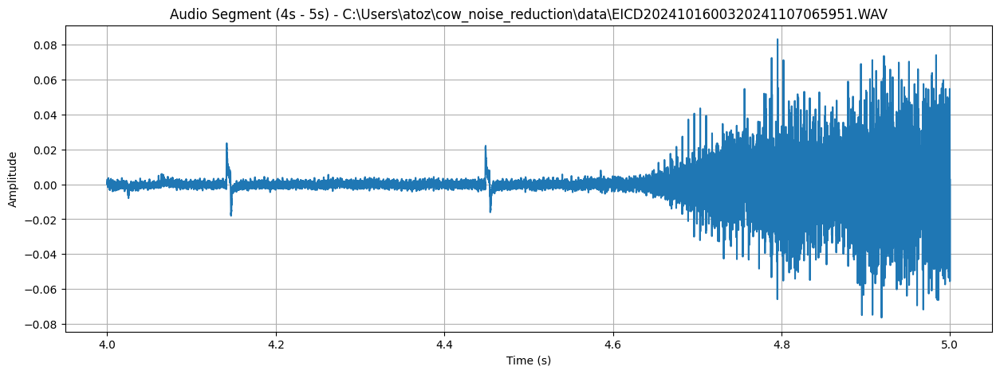

In [55]:
# 파일 경로 설정
audio_file_path= r'C:\Users\atoz\cow_noise_reduction\data\EICD2024101600320241107065951.WAV'

    
try:
    # 오디오 파일 로드
    y, sr = librosa.load(audio_file_path, sr=None)

    # 10~11초 구간 선택
    start_time = 4
    end_time = 5
    start_idx = int(start_time * sr)
    end_idx = int(end_time * sr)

    # 구간 추출
    segment = y[start_idx:end_idx]

    # 파형 시각화
    if len(segment) > 0:
        time = np.arange(len(segment)) / sr + start_time
        plt.figure(figsize=(15, 5))
        plt.plot(time, segment)
        plt.title(f'Audio Segment ({start_time}s - {end_time}s) - {audio_file_path}')
        plt.xlabel('Time (s)')
        plt.ylabel('Amplitude')
        plt.grid(True)
        plt.show()
    else:
        print(f"Warning: No audio data found in the selected range for {audio_file_path}")

except Exception as e:
    print(f"Error processing {audio_file_path}: {e}")


문제발생 
- 1.클릭음 위치에 있는 모든 음을 지워버림
- 2.클릭음이 안잡히는 곳들도 있음 -> HPSS로 해결

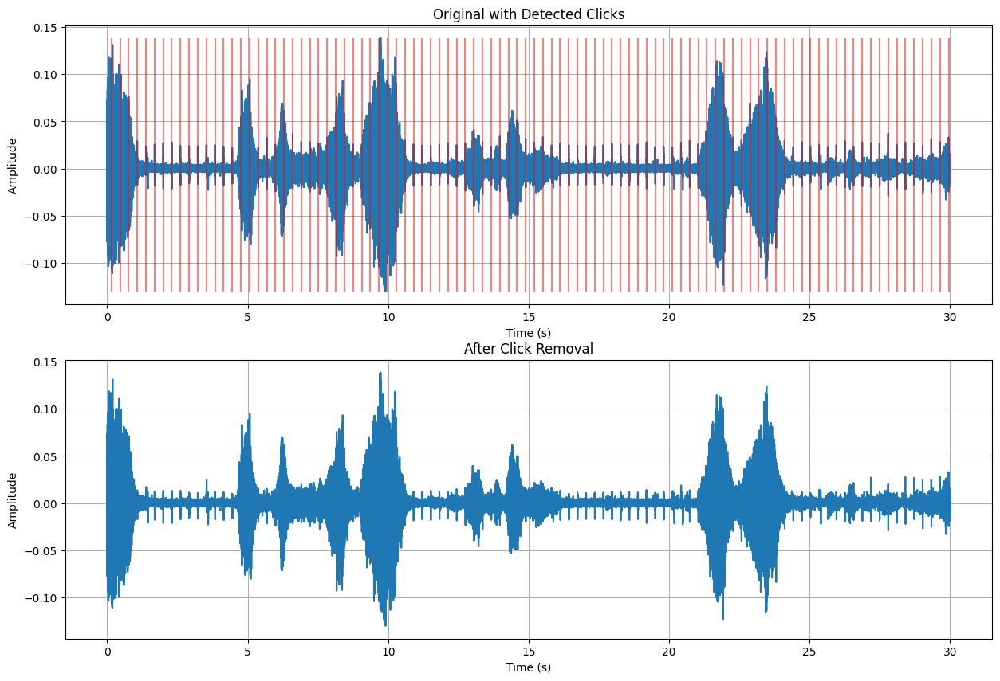


원본:



처리 후:


In [57]:
from IPython.display import Audio, display
from scipy.signal import find_peaks, butter, filtfilt

def detect_base_pattern(y, sr, start_time=2, duration=3):
   start_idx = int(start_time * sr)
   end_idx = int((start_time + duration) * sr)
   segment = y[start_idx:end_idx]
   
   peaks, _ = find_peaks(np.abs(segment),
                        height=0.009,
                        distance=sr*0.298,
                        prominence=0.005,
                        width=(sr*0.0005, sr*0.002))
   
   click_times = peaks / sr + start_time
   
   if len(peaks) > 1:
       intervals = np.diff(peaks)
       avg_interval = np.median(intervals)
       return click_times, avg_interval/sr
   return None, None

def extend_pattern(click_times, interval, total_duration):
   extended_times = list(click_times)
   
   prev_time = click_times[0]
   while prev_time - interval > 0:
       prev_time -= interval
       extended_times.insert(0, prev_time)
   
   next_time = click_times[-1]
   while next_time + interval < total_duration:
       next_time += interval
       extended_times.append(next_time)
   
   return np.array(extended_times)

def remove_clicks(y, sr, click_times, duration=0.002):
   cleaned = y.copy()
   window = int(duration * sr)
   
   for t in click_times:
       idx = int(t * sr)
       if idx - window < 0 or idx + window >= len(y):
           continue
           
       local_window = y[idx-window:idx+window]
       local_peak = np.argmax(np.abs(local_window))
       exact_idx = idx - window + local_peak
       
       half_width = int(sr * 0.001)
       start = max(0, exact_idx - half_width)
       end = min(len(y), exact_idx + half_width)
       
       pre_samples = y[max(0, start-half_width):start]
       post_samples = y[end:min(end+half_width, len(y))]
       
       if len(pre_samples) > 0 and len(post_samples) > 0:
           pre_val = np.median(pre_samples)
           post_val = np.median(post_samples)
           
           t = np.linspace(0, 1, end-start)
           interp = pre_val * (1-t) + post_val * t
           window_func = np.hanning(end-start)
           
           cleaned[start:end] = interp * 0.75 + y[start:end] * 0.25
   
   return cleaned

def visualize_results(y, sr, click_times, cleaned):
   time = np.arange(len(y))/sr
   plt.figure(figsize=(15, 10))
   
   plt.subplot(2, 1, 1)
   plt.plot(time, y)
   plt.vlines(click_times, y.min(), y.max(), color='r', alpha=0.5)
   plt.title('Original with Detected Clicks')
   plt.xlabel('Time (s)')
   plt.ylabel('Amplitude')
   plt.grid(True)
   
   plt.subplot(2, 1, 2)
   plt.plot(time, cleaned)
   plt.title('After Click Removal')
   plt.xlabel('Time (s)')
   plt.ylabel('Amplitude')
   plt.grid(True)
   plt.show()

def main():
   audio_file_path = r'C:\Users\atoz\cow_noise_reduction\data\EICD2024101600320241107065951.WAV'
   y, sr = librosa.load(audio_file_path, sr=None)
   
   click_times, interval = detect_base_pattern(y, sr)
   if click_times is None:
       print("클릭음 패턴을 찾을 수 없습니다.")
       return
       
   extended_times = extend_pattern(click_times, interval, len(y)/sr)
   cleaned = remove_clicks(y, sr, extended_times)
   
   visualize_results(y, sr, extended_times, cleaned)
   sf.write('cleaned_audio.wav', cleaned, sr)
   
   print("\n원본:")
   display(Audio(y, rate=sr))
   print("\n처리 후:")
   display(Audio(cleaned, rate=sr))

if __name__ == "__main__":
   main()

클릭음을 제대로 탐지했으나, 클릭음이 지워지다 말았다.

[결론]
V0.1~V0.3중 BEST = V0.2 
- > 왜냐하면 클릭음 완벽히 제거되었으며, 원본 음성 손실률도 작고, 음성이 부드럽게 이어짐
- Librosa 라이센스 확인 
- https://github.com/librosa/librosa/blob/main/LICENSE.md -> 무료확인 